In [1]:
import os
import numpy as np

import trimesh

import scipy.ndimage as ndimage
import skimage.morphology as morphology

import networkx as nx
from sklearn.neighbors import NearestNeighbors

from splipy import curve_factory

%matplotlib widget
import matplotlib.pyplot as plt
from matplotlib.widgets import CheckButtons, Slider

## Data

Load triangle mesh

In [2]:
# Surface Mesh
mesh = trimesh.load_mesh(file_obj="11d.obj", file_type="obj")

Get binary images (surface + filled)

In [3]:
def binary_to_coordinates(binary:np.ndarray):

    ''' Get coordinates of pixels ("1" values) from 3D binary image
    
    Parameters
    ----------
    binary : numpy.NDArray
        3D binary image
    
    Returns
    -------
    x, y, z : numpy.NDArray
        x, y, and z coordinates of pixels, where the origin is (0,0,0)
    '''

    # get "1" values
    coords = np.array(np.where(binary == 1))

    # split
    x = coords[0,:]
    y = coords[1,:]
    z = coords[2,:]

    return x, y, z

In [4]:
# Filled Binary Image
image = mesh.voxelized(1).fill().matrix.astype(int)
X, Y, Z = binary_to_coordinates(image)

Find the space curve that best represents the shape

In [5]:
def best_path(skeleton:np.ndarray) -> tuple[np.ndarray, np.ndarray, np.ndarray]:

    ''' Find the best path between skeleton points
    
    Parameters
    ----------
    skeleton : numpy.NDArray
        binary image of skeleton points
    
    Returns
    -------
    x, y, z : numpy.NDArray
        ordered x, y, and z coordinates of skeleton points
    '''

    # get skeleton points
    x, y, z = binary_to_coordinates(skeleton)
    pts = np.c_[x, y, z]

    # neighbors and graphs
    nn = NearestNeighbors(n_neighbors=2).fit(pts)
    g = nx.from_scipy_sparse_array(nn.kneighbors_graph(mode="distance"))

    # shortest path for each start point
    paths = [list(nx.dfs_preorder_nodes(g, i)) for i in range(len(pts))]

    # get lowest cost path
    dist = np.inf
    idx = 0

    # for each shortest path:
    for i in range(len(pts)):
        p = paths[i]
        ordered = pts[p]
        cost = (((ordered[:-1] - ordered[1:])**2).sum(1)).sum()

        # better path
        if cost < dist:
            dist = cost
            idx = i

    # get best path
    order = paths[idx]

    # sort vertices
    x = x[order]
    y = y[order]
    z = z[order]

    return x, y, z

In [6]:
# Get Curve

# binary opening + skeletonization
skeleton = ndimage.binary_opening(image, iterations=3).astype(int)
skeleton = morphology.skeletonize(skeleton)

# shortest path between skeleton points
xP, yP, zP = best_path(skeleton)

# cubic spline interpolation
control = np.concatenate((xP.reshape(-1,1), yP.reshape(-1,1), zP.reshape(-1,1)), axis=1)
curve = curve_factory.cubic_curve(control)

# parameter limits
u0 = curve.start()[0]
u1 = curve.end()[0]

# get sample points
u = np.linspace(curve.start()[0], curve.end()[0], 1000)
pts = curve.evaluate(u)
xC, yC, zC = pts[:,0], pts[:,1], pts[:,2]

## Space Curve Geometry

Visualize geometric properties of the center space curve

In [7]:
# Frenet Frame
def get_frame(u:float) -> tuple[tuple[np.ndarray, np.ndarray, np.ndarray],
                                tuple[np.ndarray, np.ndarray, np.ndarray],
                                tuple[np.ndarray, np.ndarray, np.ndarray]]:

    ''' Get Frenet Frame coordinates

    Parameters
    ----------
    u : float
        position along curve
    
    Returns
    -------
    t, n, b : tuple of 3 numpy.NDArrays
        coordinates for frenet frame
    '''
    
    # point
    P = curve.evaluate(u).reshape(1, -1)

    # vectors
    def normalize(v:np.ndarray) -> np.ndarray:
        return v.reshape(1, -1) / np.linalg.norm(v) * 2.5

    T = normalize(curve.tangent(u))
    N = normalize(curve.normal(u))
    B = normalize(curve.binormal(u))

    # plotting values
    t = np.concatenate((P, P + T), axis=0)
    n = np.concatenate((P, P + N), axis=0)
    b = np.concatenate((P, P + B), axis=0)

    return (t[:,0], t[:,1], t[:,2]), (n[:,0], n[:,1], n[:,2]), (b[:,0], b[:,1], b[:,2])

In [8]:
# Curvature & Torsion
def get_kappa_tau(u:float) -> tuple[str, str]:

    ''' Get curvature (kappa) and torsion (tau)

    Parameters
    ----------
    u : float
        position along curve
    
    Returns
    -------
    k,t : strings
        labels for curvature and torsion
    '''

    # curvature
    kappa = curve.curvature(u)
    k = f"Curvature: {r"$\bf\kappa$"} = {kappa:,.3}"

    # torsion
    tau = curve.torsion(u)
    t = f"Torsion:  {r"$\bf\tau$"} = {tau:.2e}"

    return k, t

In [9]:
# Visualize Geometry

def space_curve_geometry(init:float=u0, elev:float=30, azim:float=60, roll:float=0, fig:plt.Figure=None) -> plt.Figure:

    ''' Plot space curve geometry

    Parameters
    ---------- 
    init : float
        initial parameter (u) value
    elev, azim, roll : float (default = 30, 60, 0)
        initial axis viewing direction values: elevation, azimuth, and roll
    fig : matplotlib.Figure (default = None)
        figure on which to plot space curve geometry \\
        if None, create new (12.5, 10) figure
    
    Returns
    -------
    fig : matplotlib.Figure
        figure on which curve was plotted
    '''

    # figure
    if not fig:
        plt.close()
        fig = plt.figure(figsize=(12.5, 10), layout="constrained")

    # axes
    ax = fig.add_subplot(111, projection="3d", elev=elev, azim=azim, roll=roll)

    # Surface
    s = ax.scatter(X, Y, Z, c=("rebeccapurple", 0.25), label="Surface")

    # Space Curve
    c, = ax.plot(xC, yC, zC, c="black", lw=2.5, label="Space Curve")

    # Frenet Frame
    f, = ax.plot(0, 0, 0, c="black", lw=1.5, label="Frenet Frame")

    (xT, yT, zT), (xN, yN, zN), (xB, yB, zB) = get_frame(init)

    t, = ax.plot(xT, yT, zT, color="tab:blue", lw=3.5, label=f"Tangent ({r"$\overrightarrow{\text{T}}$"})") 
    n, = ax.plot(xN, yN, zN, color="tab:orange", lw=3.5, label=f"Normal ({r"$\overrightarrow{\text{N}}$"})")
    b, = ax.plot(xB, yB, zB, color="tab:green", lw=3.5, label=f"Binormal ({r"$\overrightarrow{\text{B}}$"})")

    # labels
    ax.set_xlabel("x", weight="bold", size="x-large")
    ax.set_ylabel("y", weight="bold", size="x-large")
    ax.set_zlabel("z", weight="bold", size="x-large")

    ax.legend(handles=[t, n, b], loc=2, prop={"size":"large"}, title="Frenet Frame", title_fontproperties={"weight":"bold", "size":"large"})

    # Curvature & Torsion Labels
    axLabels = ax.inset_axes([0.725, 0.9, 0.275, 0.1])

    axLabels.set_xticks([])
    axLabels.set_yticks([])

    kappa_txt, tau_txt = get_kappa_tau(init)

    kappa = axLabels.text(x=0.1, y=2/3, s=kappa_txt, ha="left", va="center", weight="bold", size="large")
    tau = axLabels.text(x=0.1, y=1/3, s=tau_txt, ha="left", va="center", weight="bold", size="large")

    # Visibility Checkbutton
    axCheck = ax.inset_axes([0.0, 0.0, 0.175, 0.125])

    plot_colors = ["rebeccapurple", "black", "tab:blue"]

    checkbutton = CheckButtons(
        ax = axCheck,
        labels = [s.get_label(), c.get_label(), f.get_label()],
        actives = [True, True, True],
        label_props = {"color": plot_colors, "size":["large"]*3},
        frame_props = {"edgecolor": plot_colors},
        check_props = {"facecolor": plot_colors},
    )

    def check_action(label):
        
        # surface
        if label == "Surface":
            labels = [s]
        
        # curve
        if label == "Space Curve":
            labels = [c]

        # frame
        elif label == "Frenet Frame":
            labels = [t, n, b]

        # change visibility
        for l in labels:
            l.set_visible(not l.get_visible())
            l.figure.canvas.draw_idle()

    checkbutton.on_clicked(check_action)

    # Position Slider
    axSlide = fig.add_axes([0.35, 0, 0.5, 0.03])

    slider = Slider(
        ax = axSlide,
        label = "Position",
        valmin = u0,
        valmax = u1,
        valinit = init,
        facecolor="black",
    )
    slider.label.set_fontsize("large")
    slider.valtext.set_fontsize("large")

    def slide_action(val):

        # change frame
        for l,v in zip([t, n, b], get_frame(val)):
            l.set_data_3d(v[0], v[1], v[2])
        
        # change kappa + tau
        for l,txt in zip([kappa, tau], get_kappa_tau(val)):
            l.set_text(txt)

    slider.on_changed(slide_action)

    return fig

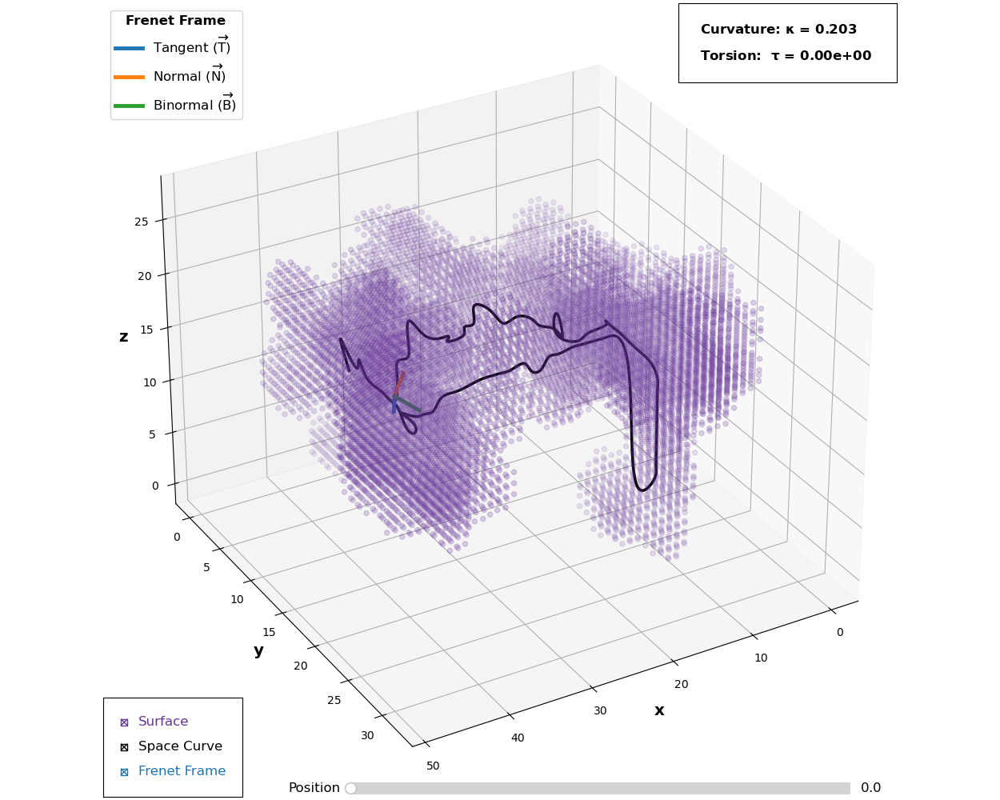

In [10]:
fig = space_curve_geometry()
fig.savefig("figures/space_curve_geometry.svg", transparent=True)

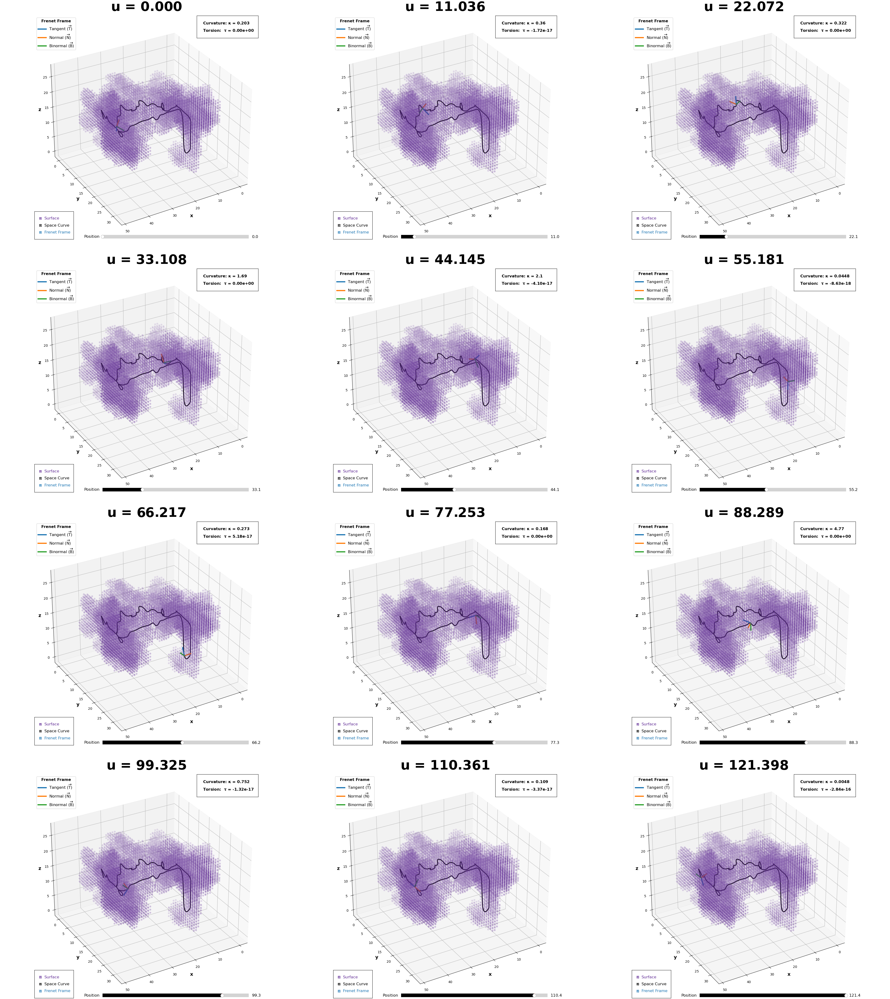

In [11]:
# Show different parameter values
plt.close()

# figure(s)
fig = plt.figure(figsize=(37.5, (40/0.95)), layout="constrained")
sub = fig.subfigures(nrows=4, ncols=3, hspace=0.05)

# parameter values angles
uvals = np.linspace(u0, u1, 12).reshape((4,3))

for i in range(4):
    for j in range(3):
        sub[i][j].suptitle(f"{r"$\bf{u}$"} = {uvals[i][j]:,.3f}", weight="bold", size=40)
        space_curve_geometry(init=uvals[i][j], fig=sub[i][j])

fig.savefig("figures/space_curve_geometry_parameter_values.svg", transparent=True, bbox_inches="tight")
fig.savefig("figures/space_curve_geometry_parameter_values.png", transparent=True, bbox_inches="tight")